In [566]:
import matplotlib.pyplot as plt
import pandas as pd

In [567]:
####### distribution
pred_log = pd.read_csv('../bestresult/result/nblogreg_9826.csv') 
pred_log_one = pd.read_csv('../bestresult/result/nblogregOnevsOne_9818.csv') 
pred_lgb = pd.read_csv('../bestresult/result/lightgbmtest.csv') 
pred_fast_rnn = pd.read_csv('../bestresult/result/fasttext_9839.csv') 
pred_best = pd.read_csv('../bestresult/result/xgb_meta_ensemble_1520435392_1520435392_2_1520446721.csv')
toxic_log = pred_log['toxic'].values
toxic_log_one = pred_log_one['toxic'].values
toxic_lgb = pred_lgb['toxic'].values
toxic_fast_rnn = pred_fast_rnn['toxic'].values
toxic_best = pred_best['toxic'].values

In [568]:
import numpy as np
BIN = 10000
y_log,x_log = np.histogram(toxic_log, bins=BIN)
y_log_one, x_log_one = np.histogram(toxic_log_one, bins=BIN)
y_lgb, x_lgb = np.histogram(toxic_lgb, bins=BIN)
y_fast_rnn, x_fast_rnn = np.histogram(toxic_fast_rnn, bins=BIN)
y_best, x_best = np.histogram(toxic_best, bins=BIN)

In [561]:
from scipy.special import logit
def edge_to_mean(x):
    result = []
    for i in range(len(x) - 1):
        result.append((x[i] + x[i+1]) / 2)
    return result
x_log = edge_to_mean(x_log)
x_log_one = edge_to_mean(x_log_one)
x_lgb = edge_to_mean(x_lgb)
x_fast_rnn = edge_to_mean(x_fast_rnn)
x_best = edge_to_mean(x_best)

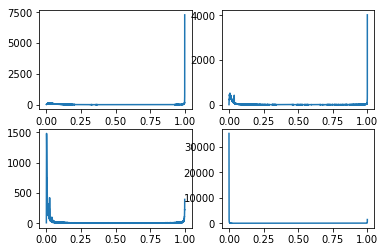

In [25]:
plt.subplot(221)
plt.plot(x_log,y_log)
plt.subplot(222)
plt.plot(x_log_one,y_log_one)
plt.subplot(223)
plt.plot(x_lgb,y_lgb)
plt.subplot(224)
plt.plot(x_fast_rnn,y_fast_rnn)
plt.show()

In [ ]:
### 
plt.plot(x_log,y_log,)
plt.title('Logistic Regression Distribution')
plt.show()

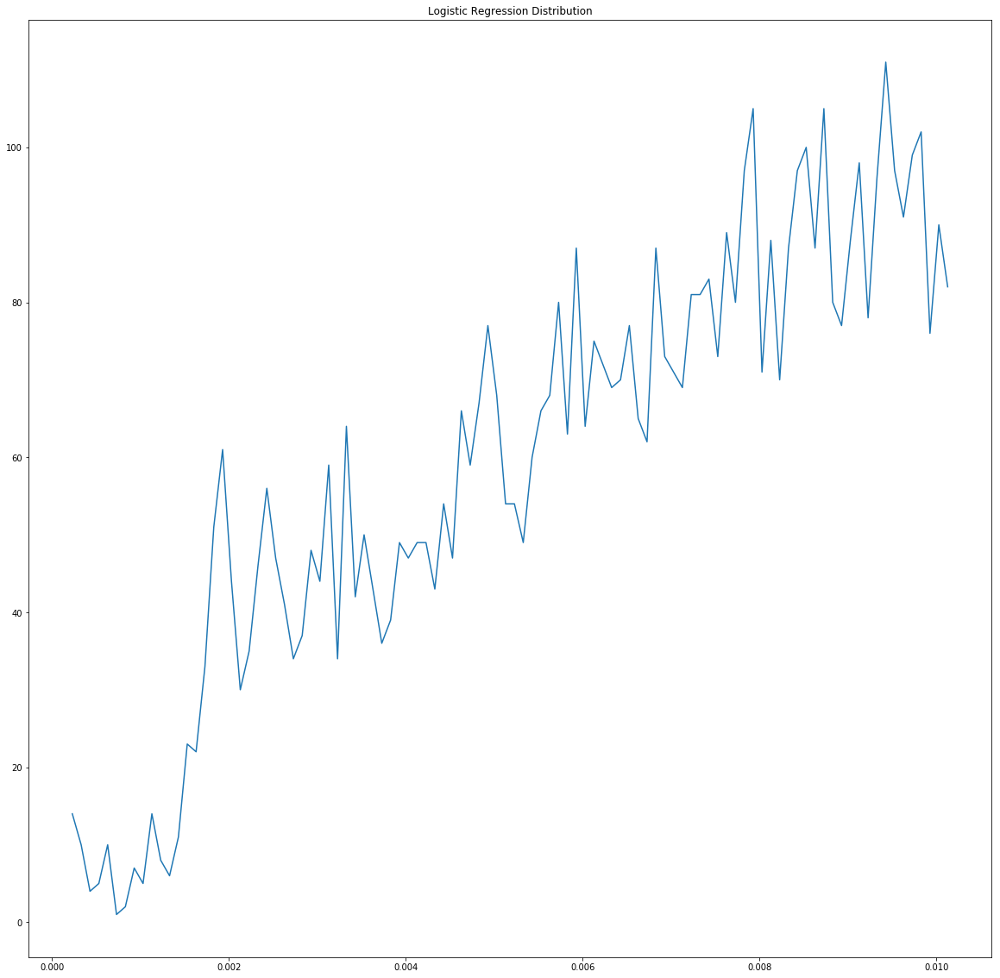

In [533]:
### 
plt.plot(x_log[:100],y_log[:100])
plt.title('Logistic Regression Distribution')
plt.show()

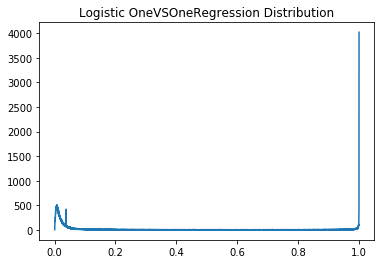

In [29]:
### 
plt.plot(x_log_one,y_log_one)
plt.title('Logistic OneVSOneRegression Distribution')
plt.show()

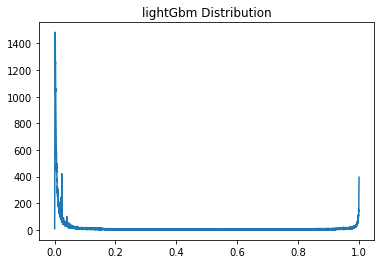

In [32]:
###  light GBM
plt.plot(x_lgb,y_lgb)
plt.title('lightGbm Distribution')
plt.show()


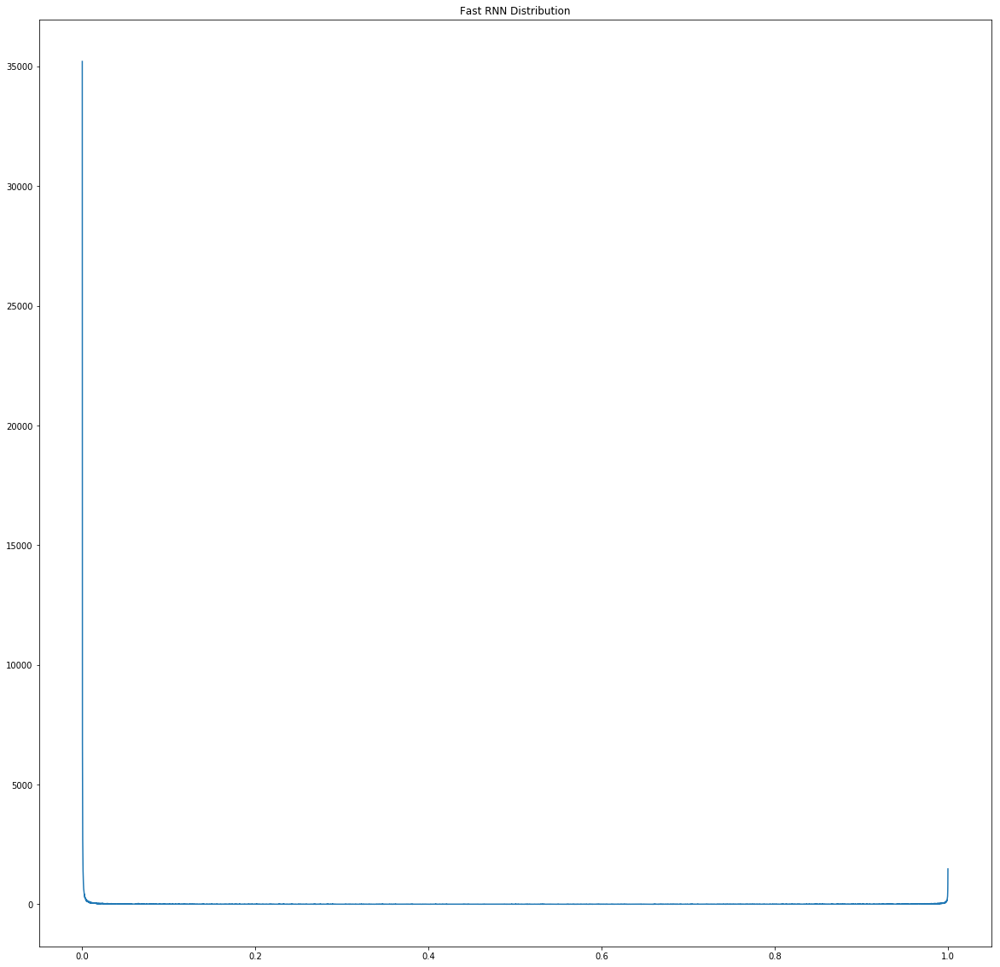

In [539]:
###  light GBM
plt.plot(x_fast_rnn[:],y_fast_rnn[:])
plt.title('Fast RNN Distribution')
plt.show()

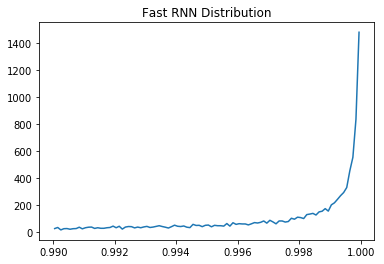

In [39]:
###  light GBM
plt.plot(x_fast_rnn[-10:],y_fast_rnn[-10:])
plt.title('Fast RNN Distribution')
plt.show()

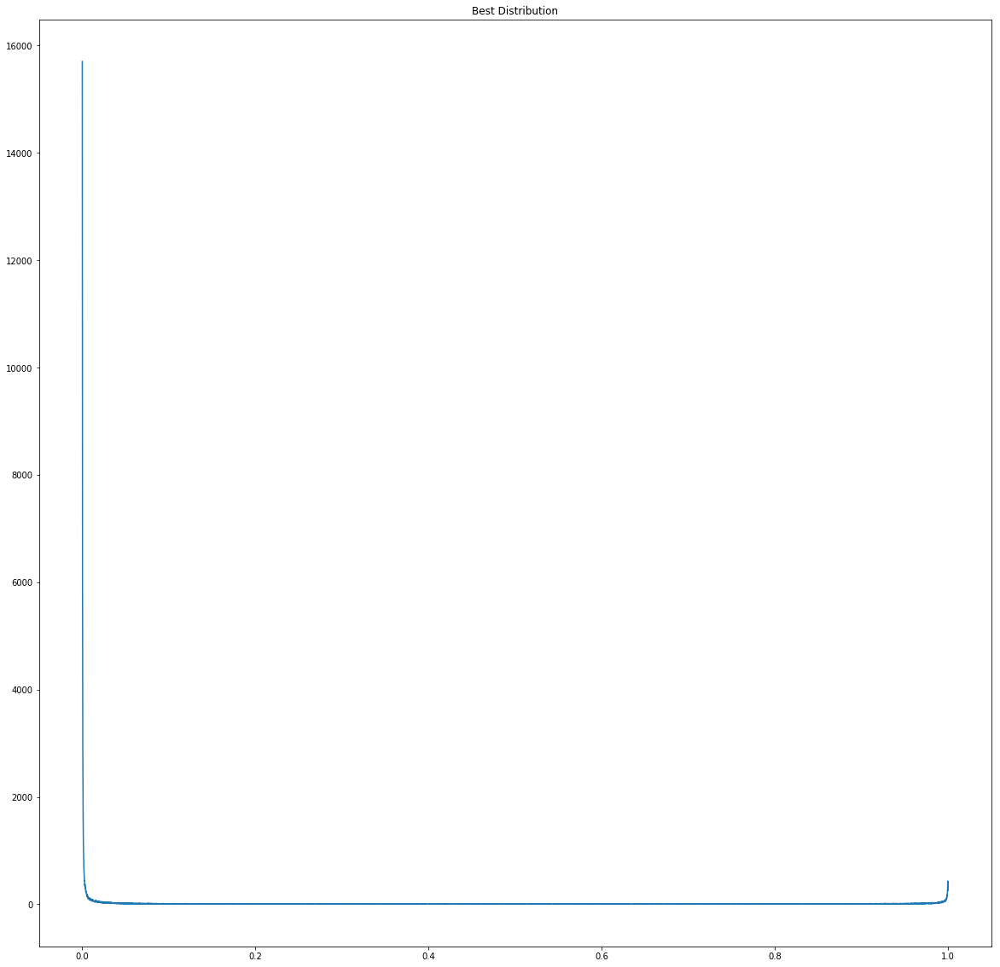

In [538]:
###  light GBM
plt.plot(x_best[:],y_best[:])
plt.title('Best Distribution')
plt.show()

In [544]:
np.array(x_best)[index]

array([8.16371018e-05, 1.81607584e-04, 2.81578066e-04, ...,
       9.99486545e-01, 9.99586516e-01, 9.99686486e-01])

In [562]:
len(x_best)

10000

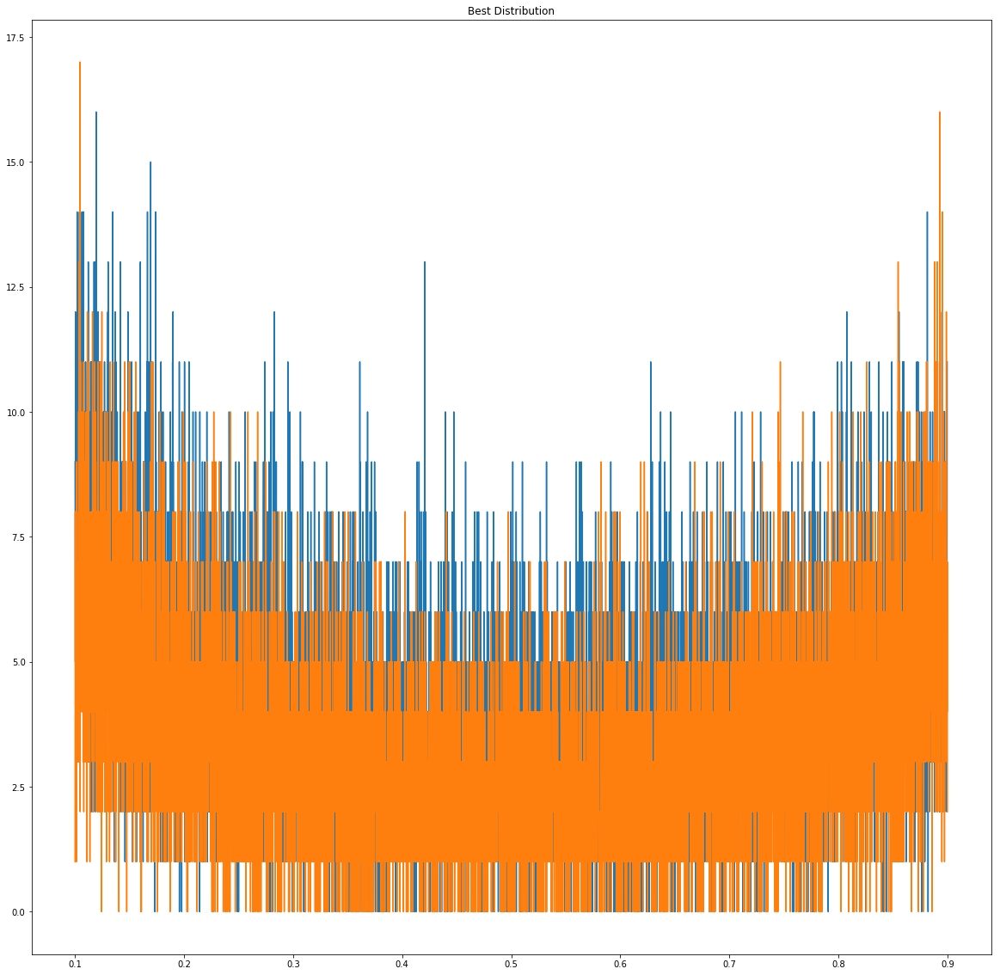

In [563]:
###  light GBM
index = list(range(len(x_best)))
index = index[1000:9000]
plt.plot(np.array(x_best)[index], np.array(y_best[index]))
plt.plot(np.array(x_fast_rnn)[index], np.array(y_fast_rnn[index]))
plt.title('Best Distribution')
plt.show()

In [557]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from itertools import combinations  
from pandas.plotting import scatter_matrix

class Visualization(object):
    def __init__(self, preds:dict, normalize = True):
        """
        preds: {col_name:predictions}
        """
        self.df = pd.DataFrame(preds)
        self.hist ={col:self._hist(self.df[col].values, normalize) for col in self.df.columns}
        
    def _hist(self, x, normalize):
        y,x = np.histogram(x, bins=BIN)
        if normalize:
            y = y / np.sum(y)
        result = []
        for i in range(len(x) - 1):
            result.append((x[i] + x[i+1]) / 2)
        return result,y
    
    def draw_hist(self, col=None, sep=False, start = None, end = None):
        if col is not None:
            if col not in self.df.columns:
                raise ValueError('Unknow col %s' % col)
            plt.plot(self.hist[col][0][start:end], self.hist[col][1][start:end])
            plt.title('{} Distribution'.format(col))
            plt.show()
            
        else:
            if not sep:
                cols = self.df.columns
                dig_1 = str(len(cols)) 
                for each in range(1, len(self.df.columns)+1):
                    dig_all = int(dig_1 + '1' +str(each))
                    plt.subplot(dig_all)
                    plt.title('{} Distribution'.format(cols[each-1]))
                    plt.plot(self.hist[cols[each-1]][0][start:end], 
                             self.hist[cols[each-1]][1][start:end])
                    plt.tight_layout() # will minimize the overlap
                plt.show()
                
            else:
                cols = self.df.columns 
                for each in cols:
                    plt.title('{} Distribution'.format(each))
                    plt.plot(self.hist[each][0][start:end], 
                             self.hist[each][1][start:end])
                    plt.tight_layout() # will minimize the overlap
                    plt.figure(figsize=(5,5))
                    plt.show()
            
    def draw_diff(self, cols = None, start = None, end = None):
        if cols is not None:
            if len(cols) < 2:
                raise ValueError('cols list should contain at least 2 elements')
            else:
                cols = self.df[cols].columns
        else:
            cols = self.df.columns
            combs = combinations(cols, 2) 
            for each_com in combs:
                col1 = each_com[0]
                col2 = each_com[1]
                x = list(range(self.df.shape[0]))[start:end]
                x = x[start:end]
                y = self.df[col1].values - self.df[col2].values
                y = y[start:end]
                plt.title('{} - {}  Distribution'.format(col1, col2))
                plt.scatter(x, y)
                plt.tight_layout() # will minimize the overlap
                plt.show()
                diff = np.sum(y ** 2) / len(y)
                print(diff)
                
    def scatter(self, cols = None, start = None, end = None, sep = True):
        if cols is not None:
                if len(cols) < 2:
                    raise ValueError('cols list should contain at least 2 elements')
                else:
                    cols = self.df[cols].columns
        else:
            cols = self.df.columns
        if sep:
            combs = combinations(cols, 2) 
            for each_com in combs:
                col1 = each_com[0]
                col2 = each_com[1]
                x = self.df[col1].values
                x = x[start:end]
                y = self.df[col2].values
                y = y[start:end]
                plt.title('x:{} & y:{}  Scatter'.format(col1, col2))
                plt.plot(x, y, '.')
                plt.tight_layout() # will minimize the overlap
                plt.show()
        else:
            Axes = scatter_matrix(self.df[cols], s=100)
            #y ticklabels
            [plt.setp(item.yaxis.get_majorticklabels(), 'size', 20) for item in Axes.ravel()]
            #x ticklabels
            [plt.setp(item.xaxis.get_majorticklabels(), 'size', 20) for item in Axes.ravel()]
            #y labels
            [plt.setp(item.yaxis.get_label(), 'size', 20) for item in Axes.ravel()]
            #x labels
            [plt.setp(item.xaxis.get_label(), 'size', 20) for item in Axes.ravel()]
#             for ax in Axes.ravel():
#                 ax.set_xlabel(ax.get_xlabel(), fontsize = 20)
#                 ax.set_ylabel(ax.get_ylabel(), fontsize = 20)
            plt.tight_layout()
            plt.show()
            

dic = {'logistic': toxic_log, 
       'fast_rnn':toxic_fast_rnn, 
       'logistic One VS One': toxic_log_one, 
       'lightgbm': toxic_lgb}
vi = Visualization(dic)

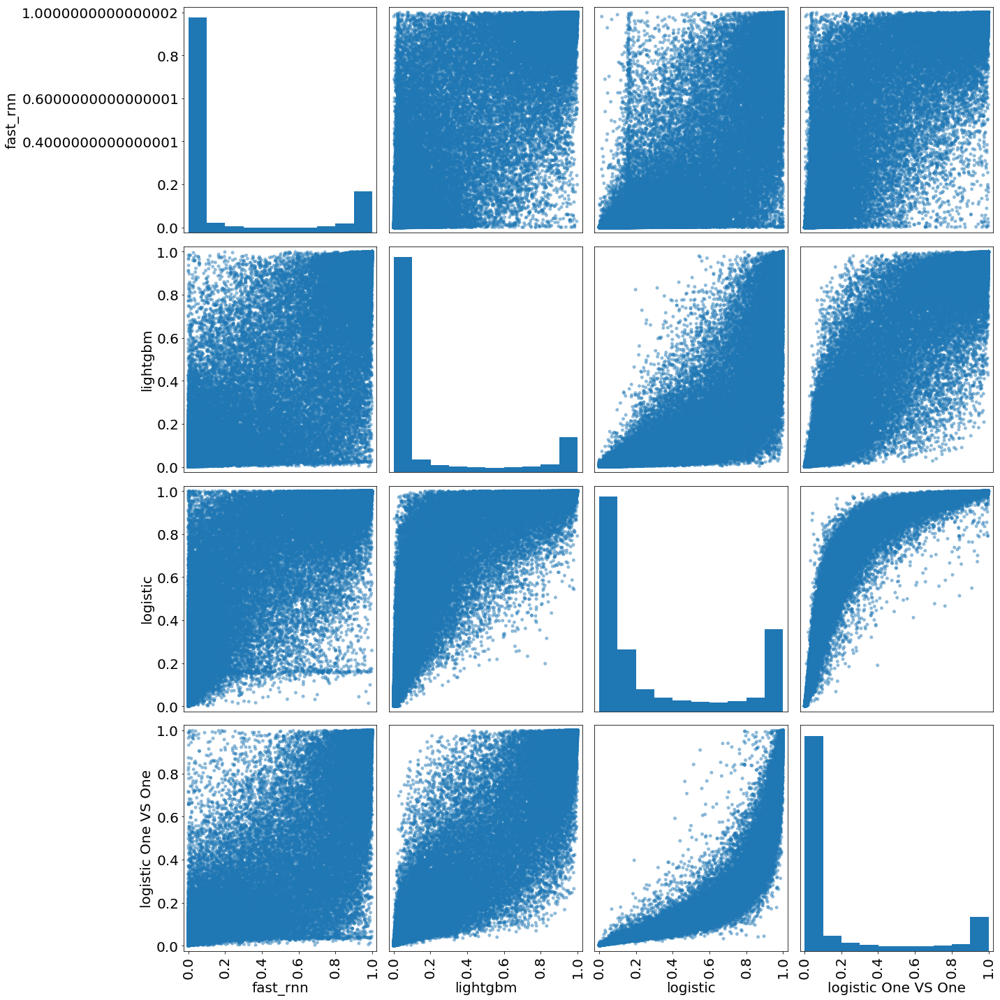

In [168]:
# vi.draw_hist(sep=True, start=None, end = None)
vi.scatter(cols = None, start=None, end = None, sep=False)
# vi.draw_diff(cols = None, start=None, end = None)
# toxic_fast_rnn[-5:None]

In [572]:
label_cols = ['toxic', 'severe_toxic', 'obscene', 'threat', 'insult', 'identity_hate']

drawer = {col:Visualization({'logistic': pred_log[col].values, 
               'fast_rnn':pred_fast_rnn[col].values, 
               'logistic One VS One': pred_log_one[col].values, 
               'lightgbm': pred_lgb[col].values, 
                'best': pred_best[col].values}) for col in label_cols}

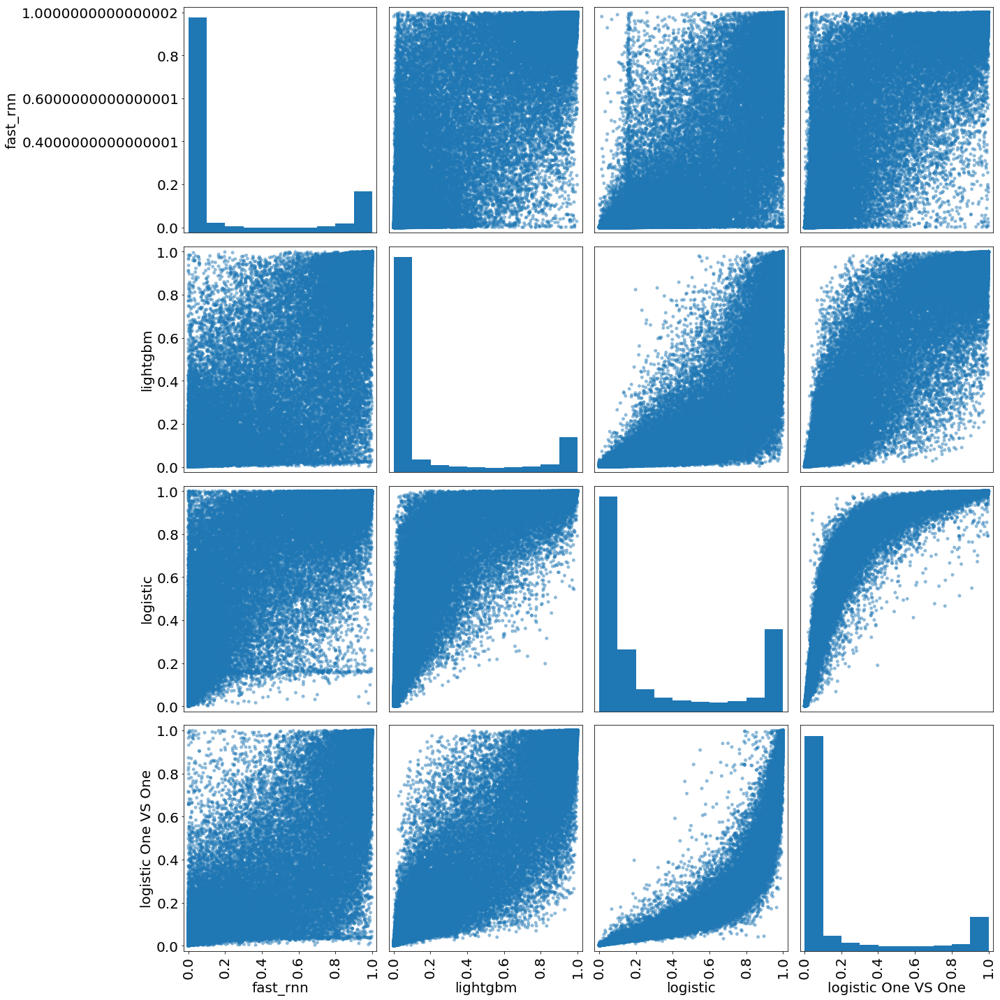

In [177]:
drawer['toxic'].scatter(sep=False)

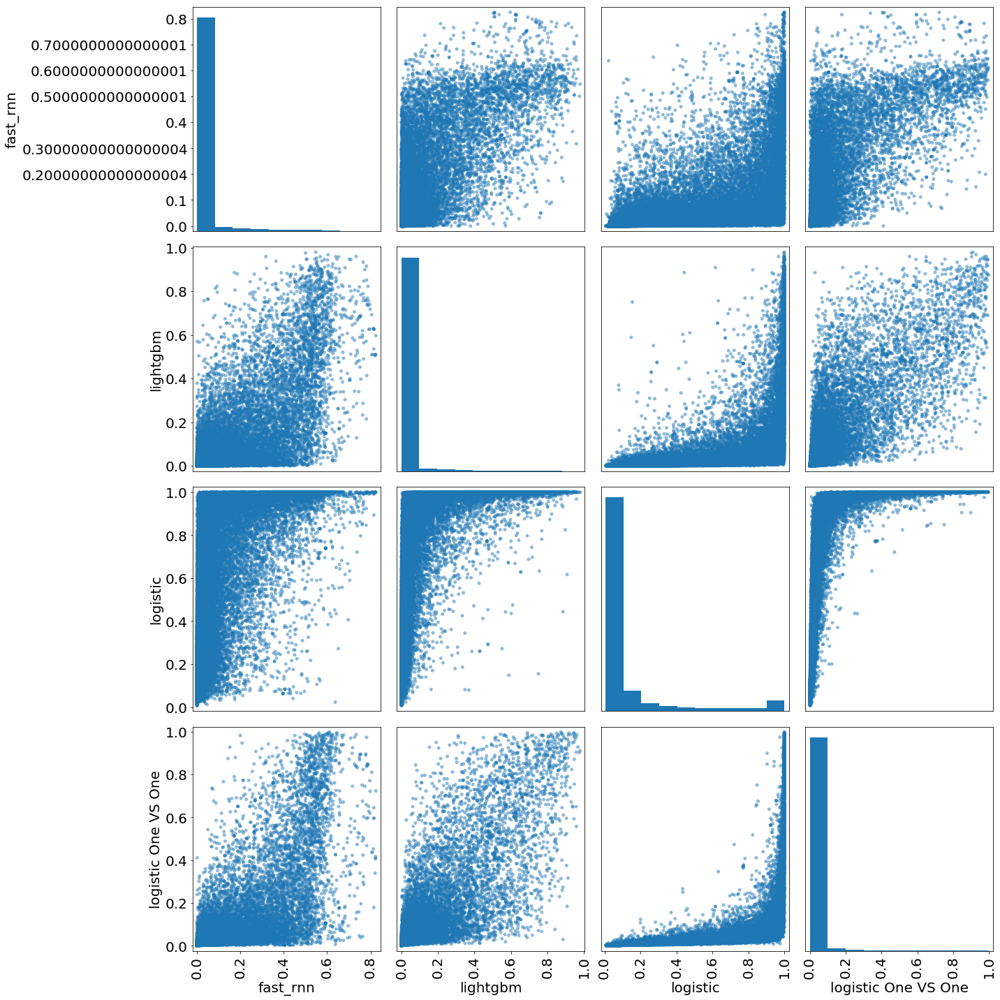

In [178]:
drawer['severe_toxic'].scatter(sep=False)

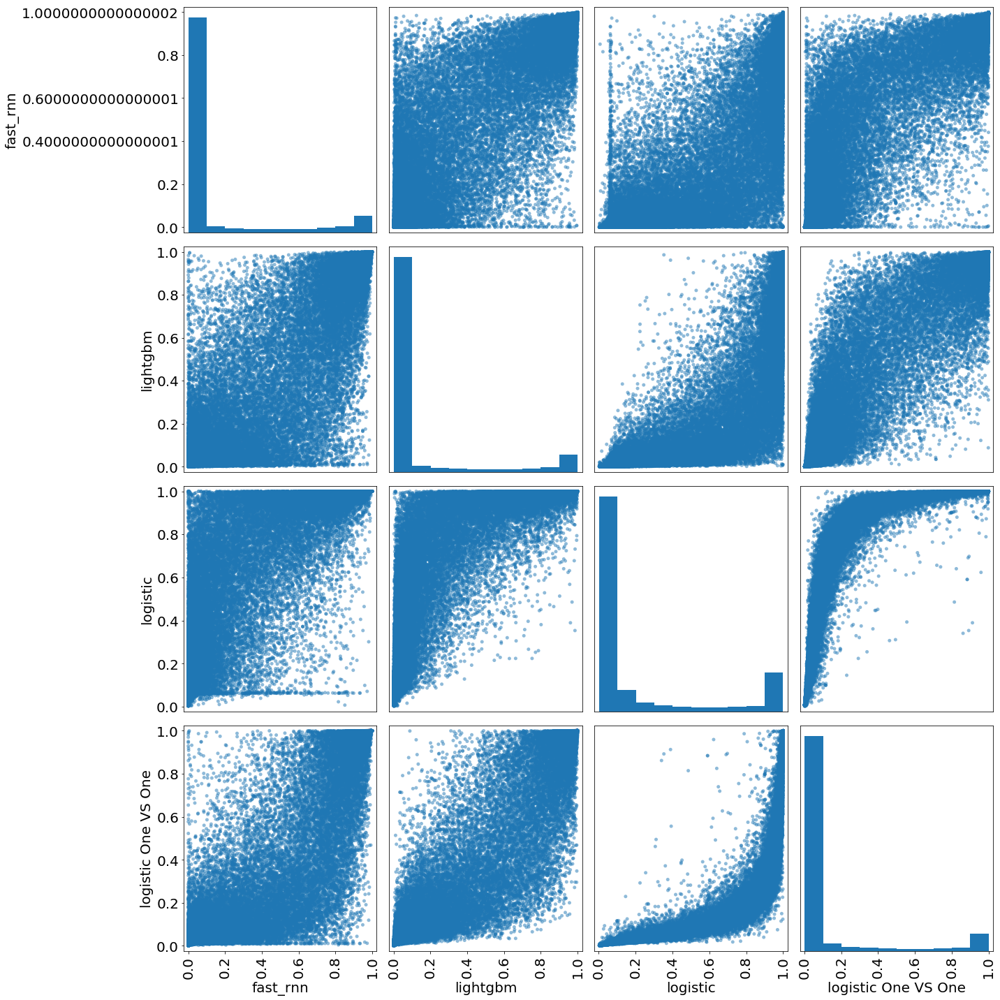

In [179]:
drawer['obscene'].scatter(sep=False)

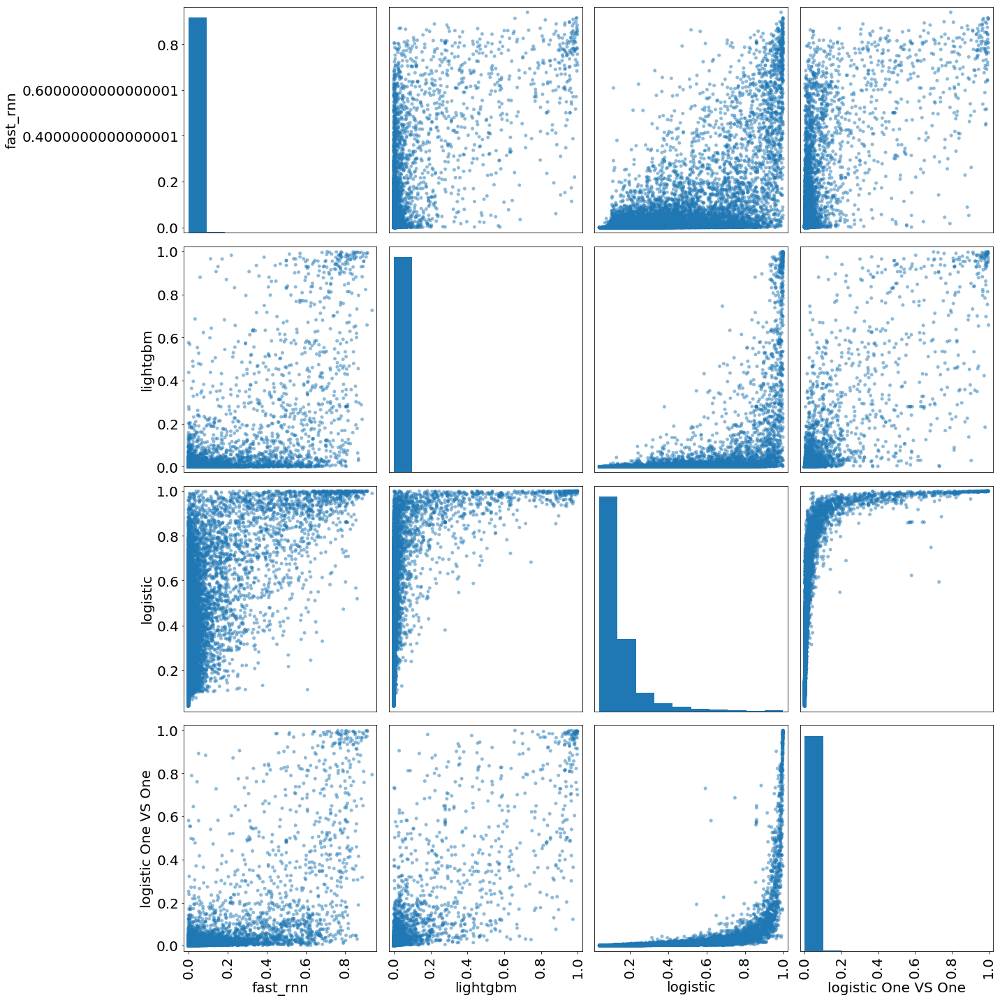

In [180]:
drawer['threat'].scatter(sep=False)

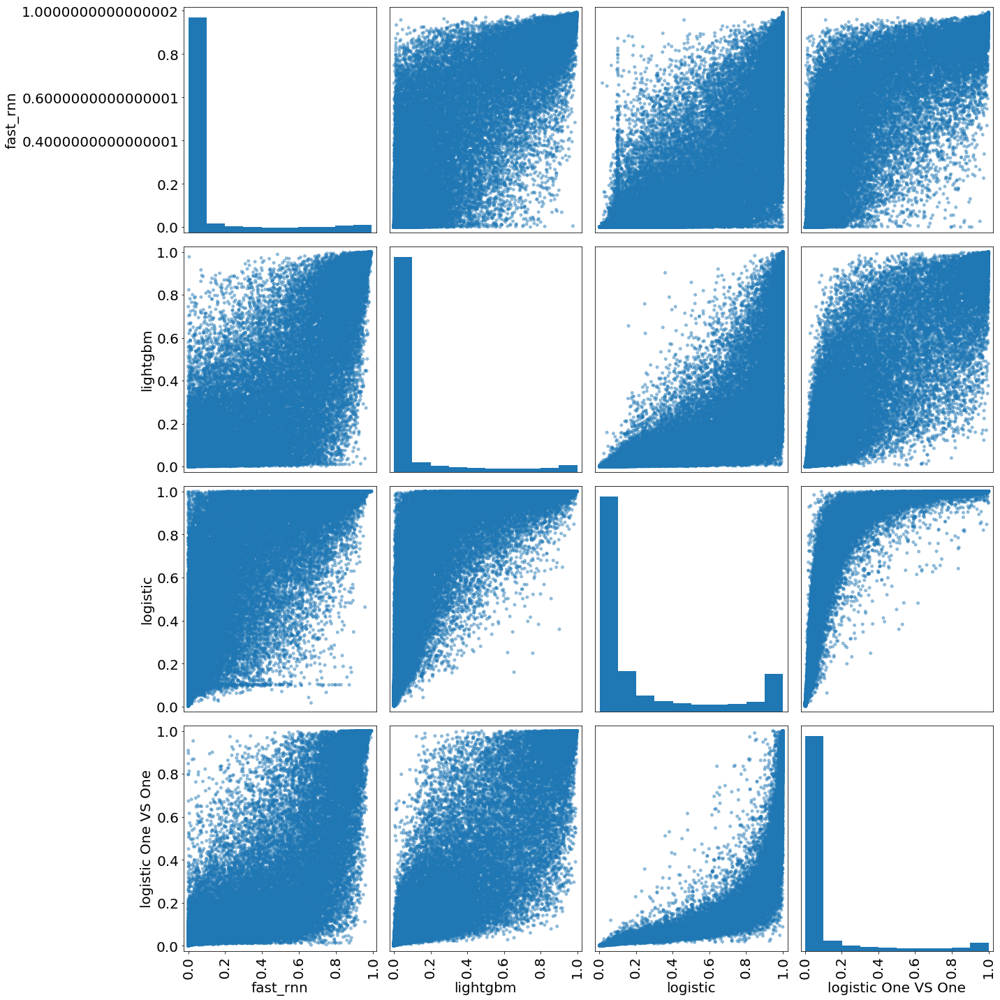

In [181]:
drawer['insult'].scatter(sep=False)

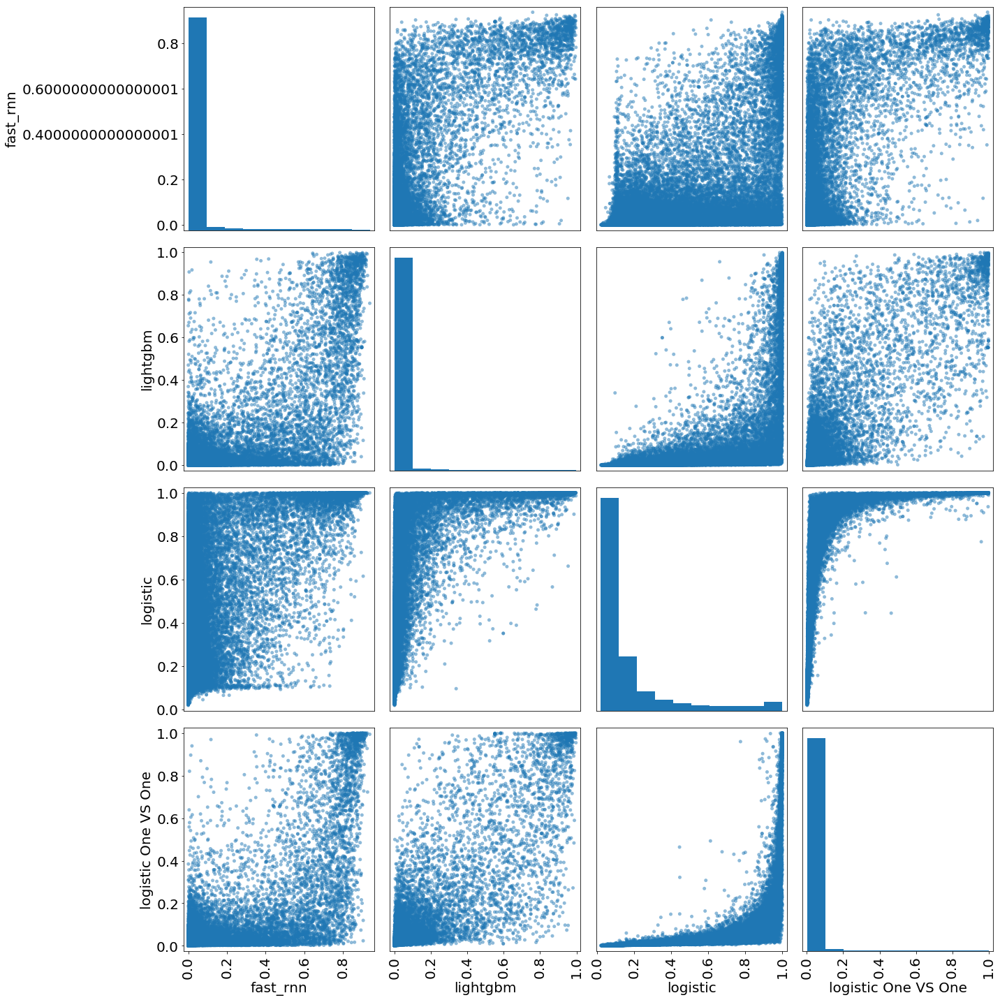

In [182]:
drawer['identity_hate'].scatter(sep=False)

toxic


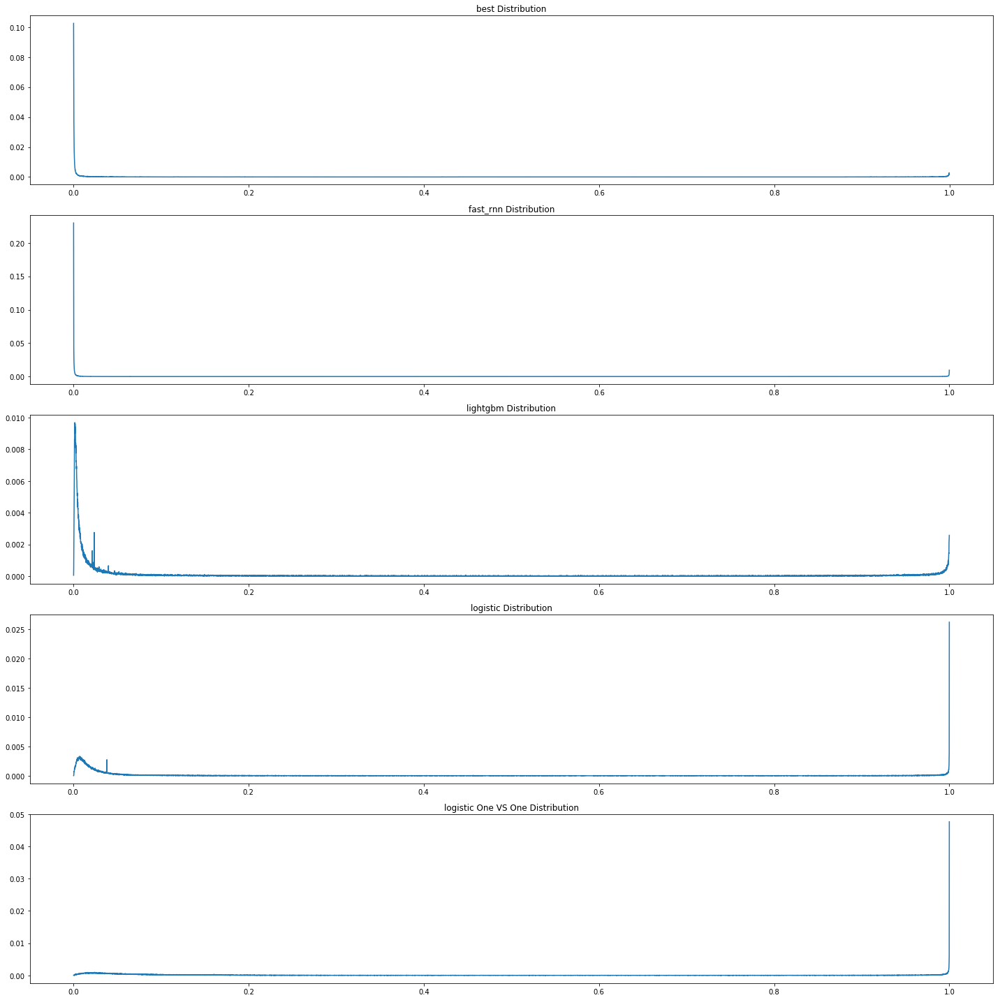

severe_toxic


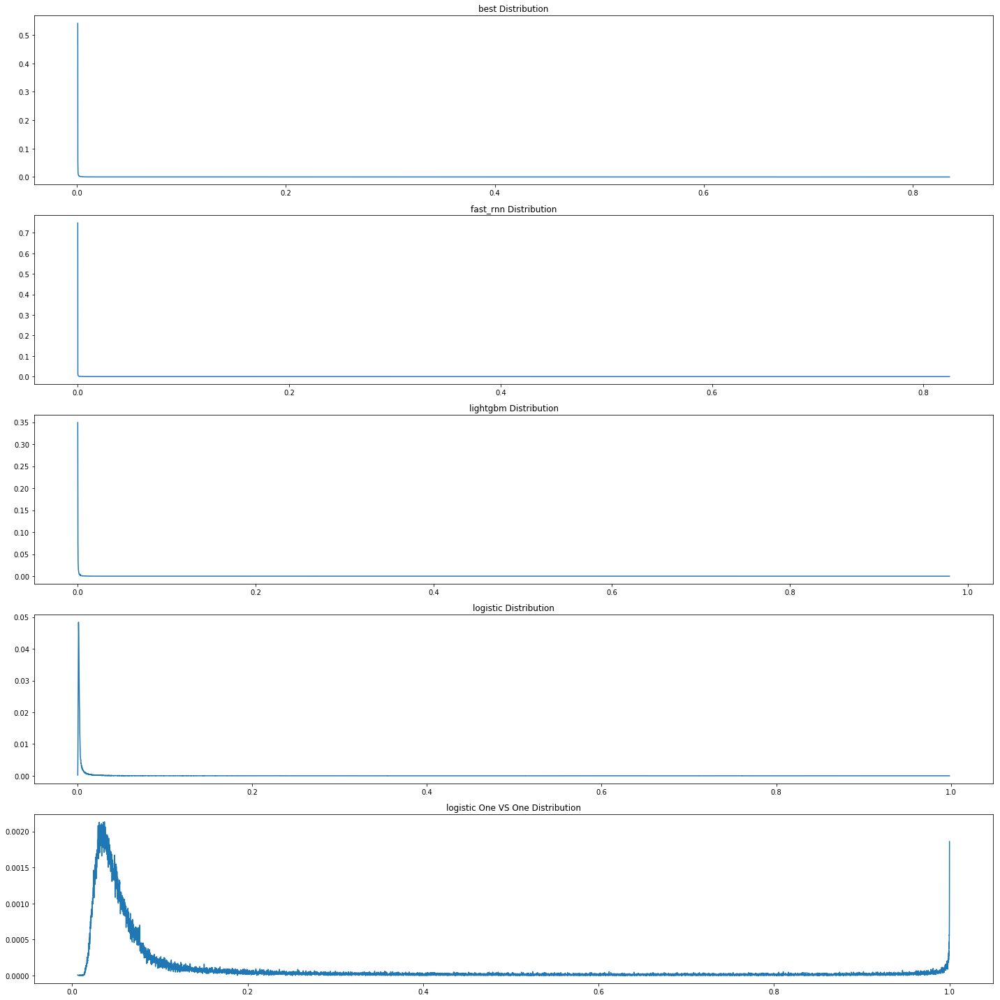

obscene


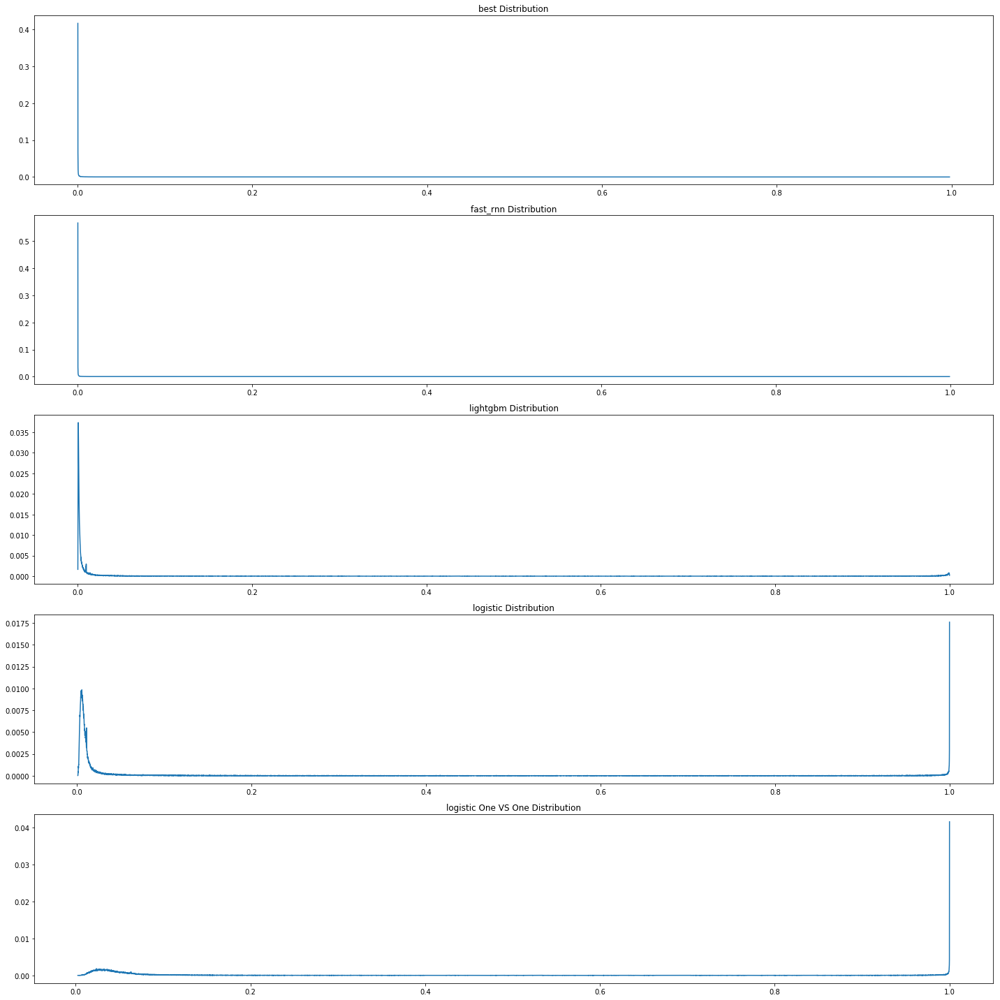

threat


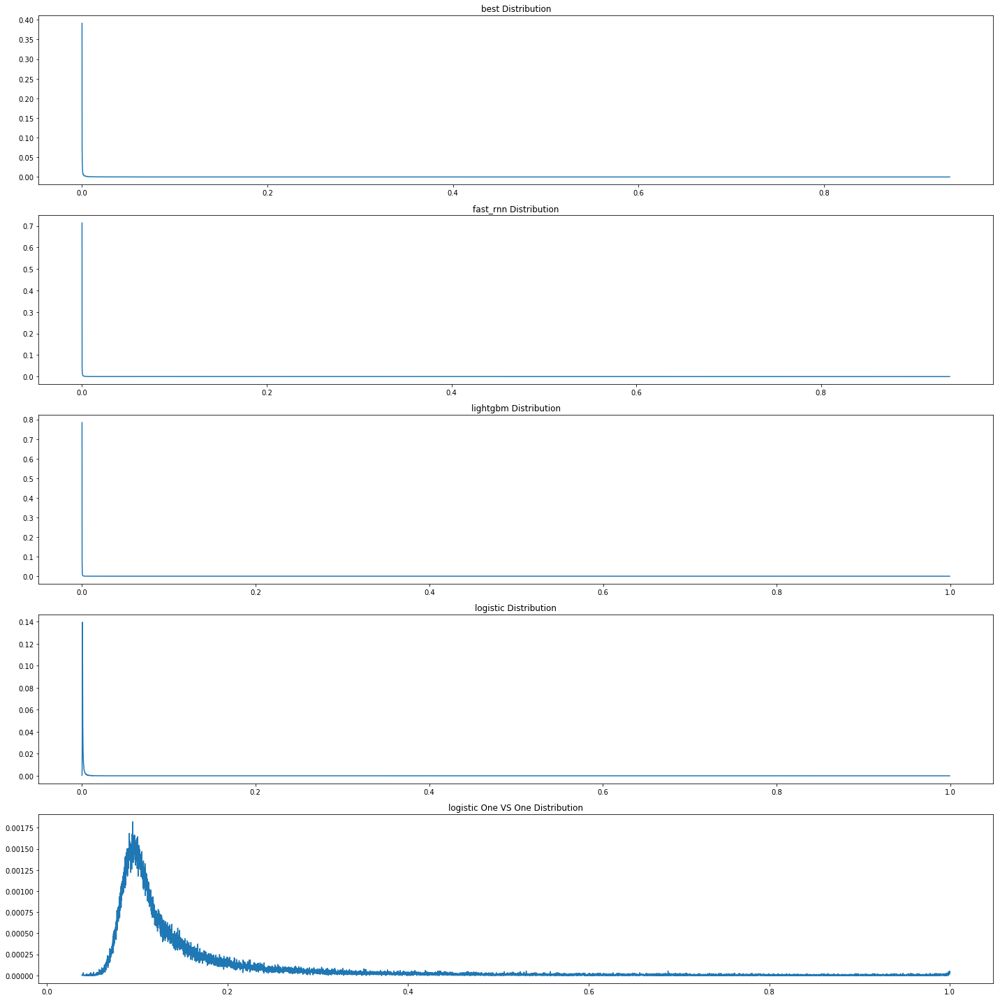

insult


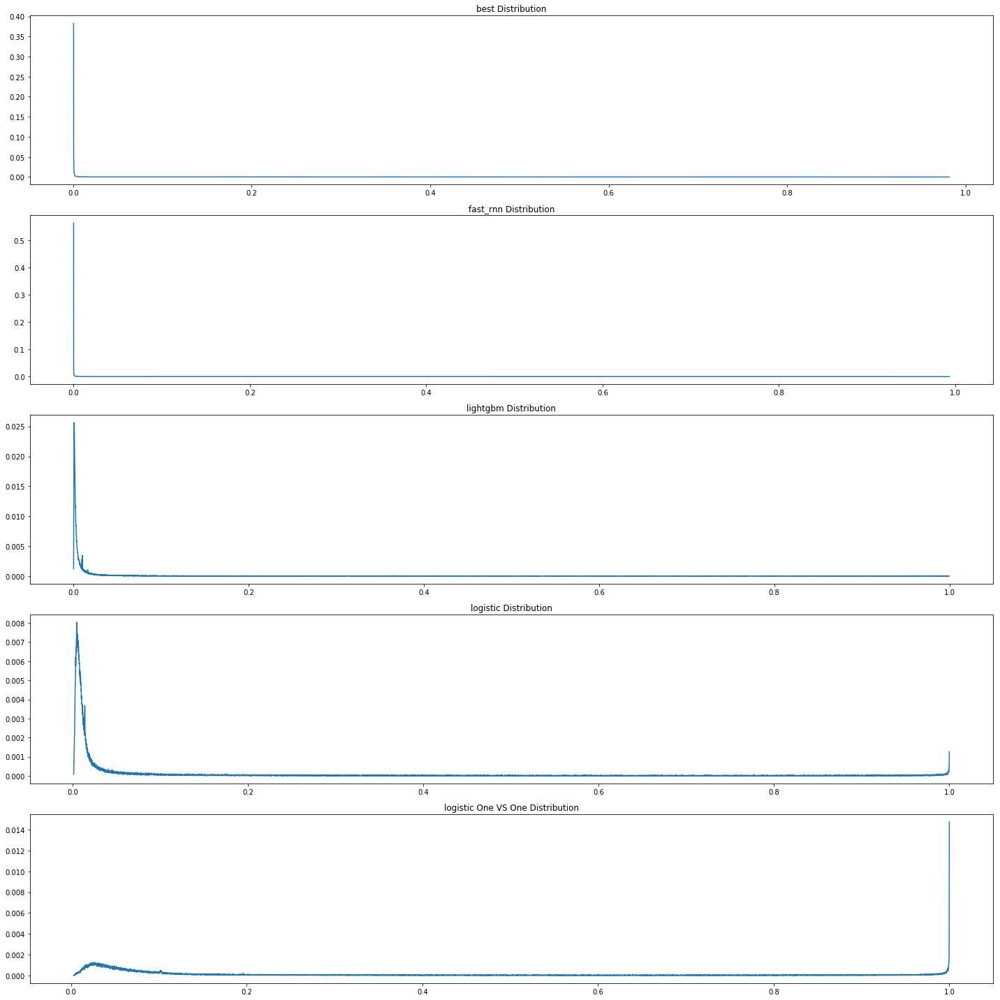

identity_hate


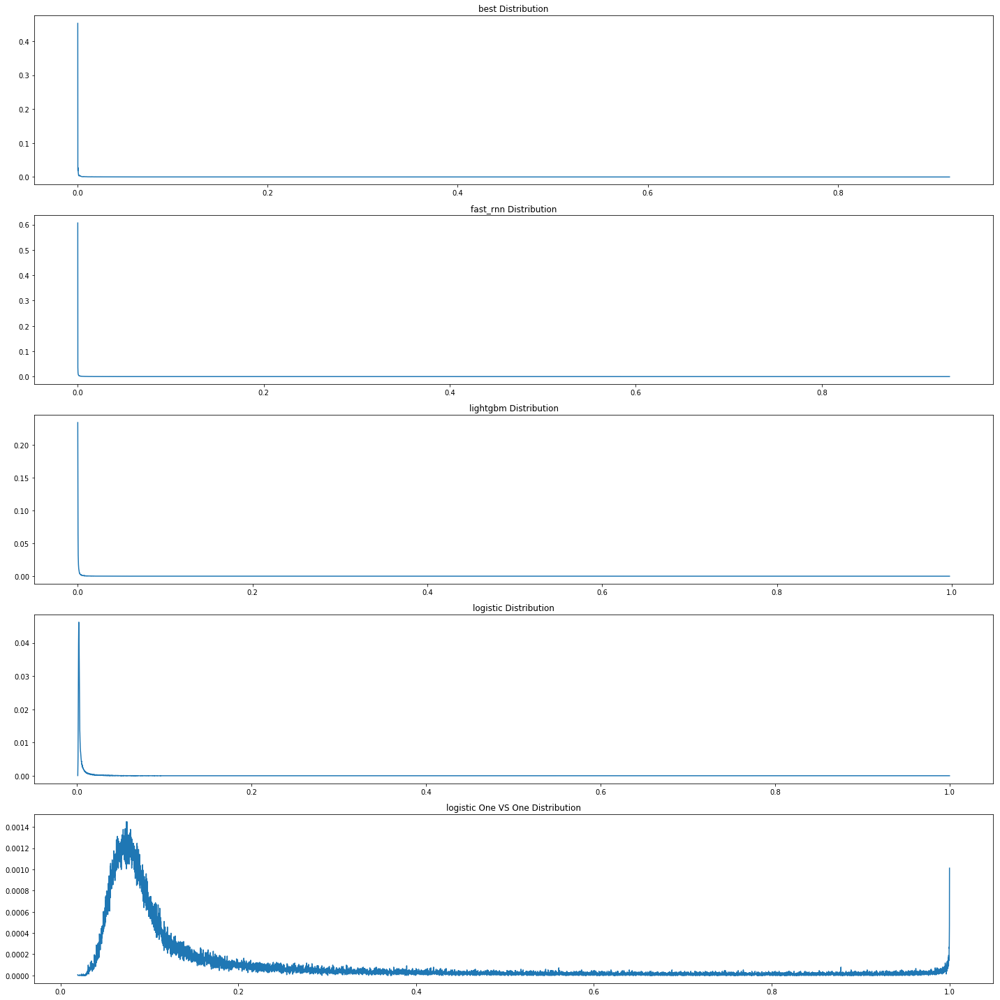

In [574]:
for col in label_cols:
    print(col)
    drawer[col].draw_hist(sep=False, start=None, end = None)
    print('=========================================')

In [263]:
def mockup(length, mean, std, seed = None, draw=True):
    r = np.random.RandomState(seed=1)
    result = r.normal(loc=mean,scale=std,size=(length,))
    result[result >= 1] = 1 - 1e-5
    result[result <= 0] = 1e-5
    if draw:
        plt.hist(result, bins = int(len(result) / 100))
        plt.show()
    return result

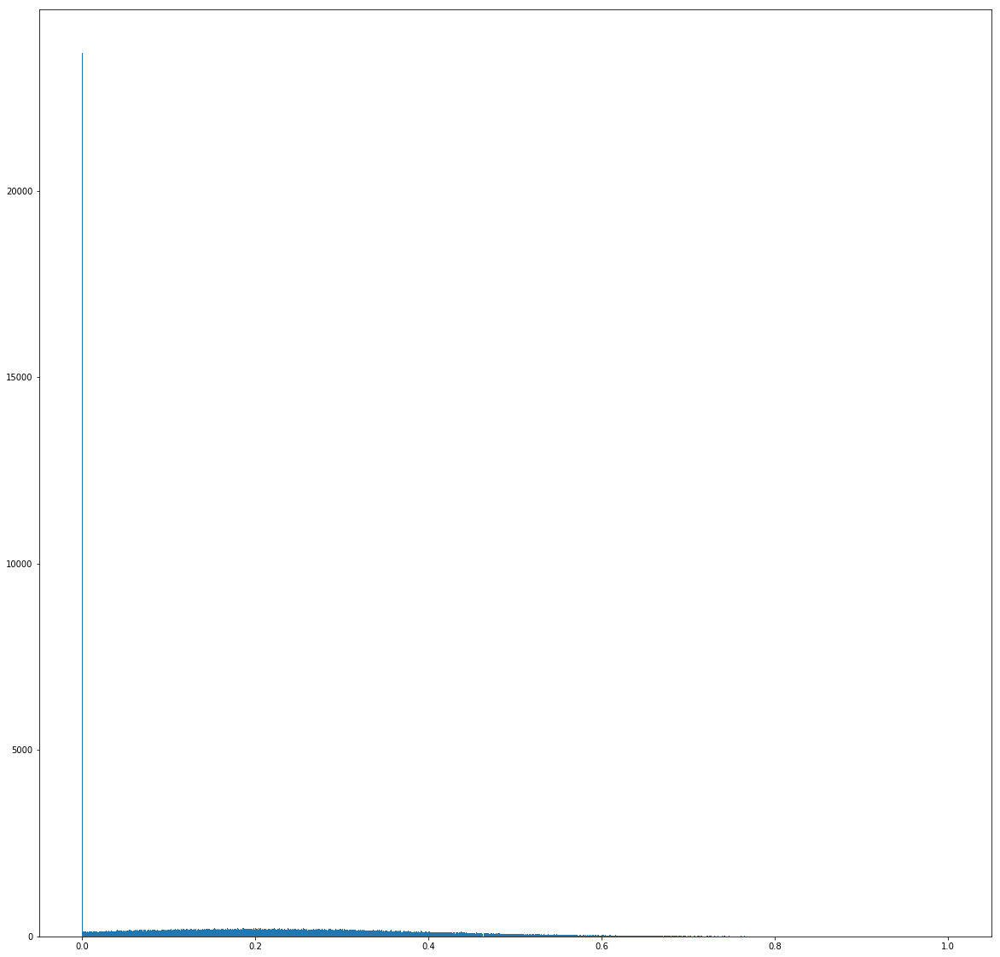

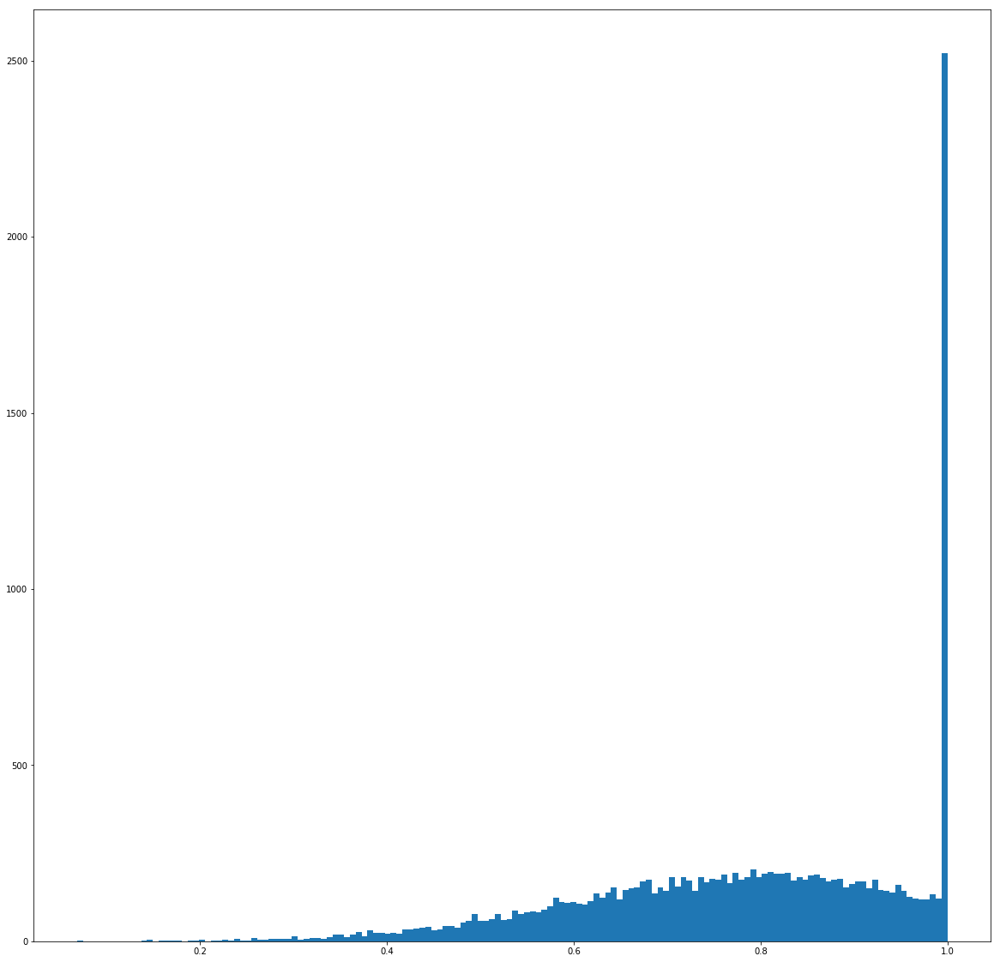

In [523]:
len_ne = 150000
len_po = 15000
ne = mockup(len_ne, 0.2, 0.2, seed = 1, draw=True)
po = mockup(len_po, 0.8, 0.2, seed = 1, draw=True)

In [524]:
y_pred = np.concatenate([ne, po])
y_actual = np.concatenate([np.zeros(len(ne)), np.ones(len(po))])
from sklearn.metrics import roc_auc_score,confusion_matrix, roc_curve
roc = roc_auc_score(y_actual, y_pred)
roc

y_pred_shift = shifting(y_pred, start=-10000, dire = '-')

In [525]:
def evaluate_point(threshold= 0.5, *y):
    area = []
    color= ['b', 'g', 'r', 'c', 'm', 'y', 'k', 'w']
    confusion = []
#     print(len(y[0]))
    print(threshold)
    for i in range(len(y[0])):
        print(i)
        y_pre = y[0][i][1].copy()
        y_act = y[0][i][0].copy()
        cur_fpr, cur_tpr, _ = roc_curve(y_act, y_pre)
        roc = roc_auc_score(y_act, y_pre)
        y_pre[y_pre >=threshold] = 1
        y_pre[y_pre < threshold] = 0
        tn, fp, fn, tp = confusion_matrix(y_true=y_act, y_pred=y_pre).ravel()
        tpr = tp / (tp + fn)
        fpr = fp / (tn + fp)
        area1 = fpr * tpr / 2
        area2 = (1 + tpr) * (1 - fpr) / 2
        area.append(area1 + area2)
        confusion.append((fpr, tpr))
        x_draw = [0, fpr, 1]
        y_draw = [0, tpr, 1]
        plt.plot(cur_fpr, cur_tpr, color=color[i],label='pair:{} - ROC:{}'.format(i, roc))
        plt.plot(x_draw, y_draw, color=color[i],label='pair:{} - thread:{} - area:{}'.format(i,threshold, area[i]))
        plt.legend(loc='center' )
        
#     plt.figure(figsize=(1,1)) 
    plt.show()
    return confusion, area

def shifting(y, start=None, end=None, step=0.1, dire='+'):
    result = y.copy()
    shift = lambda x: x - step if dire is '-' else x + step
    result[start:end] = shift(y[start:end])
    result[result >= 1] = 1 - 1e-5
    result[result <= 0] = 1e-5
    return result
    

0.5
0
1


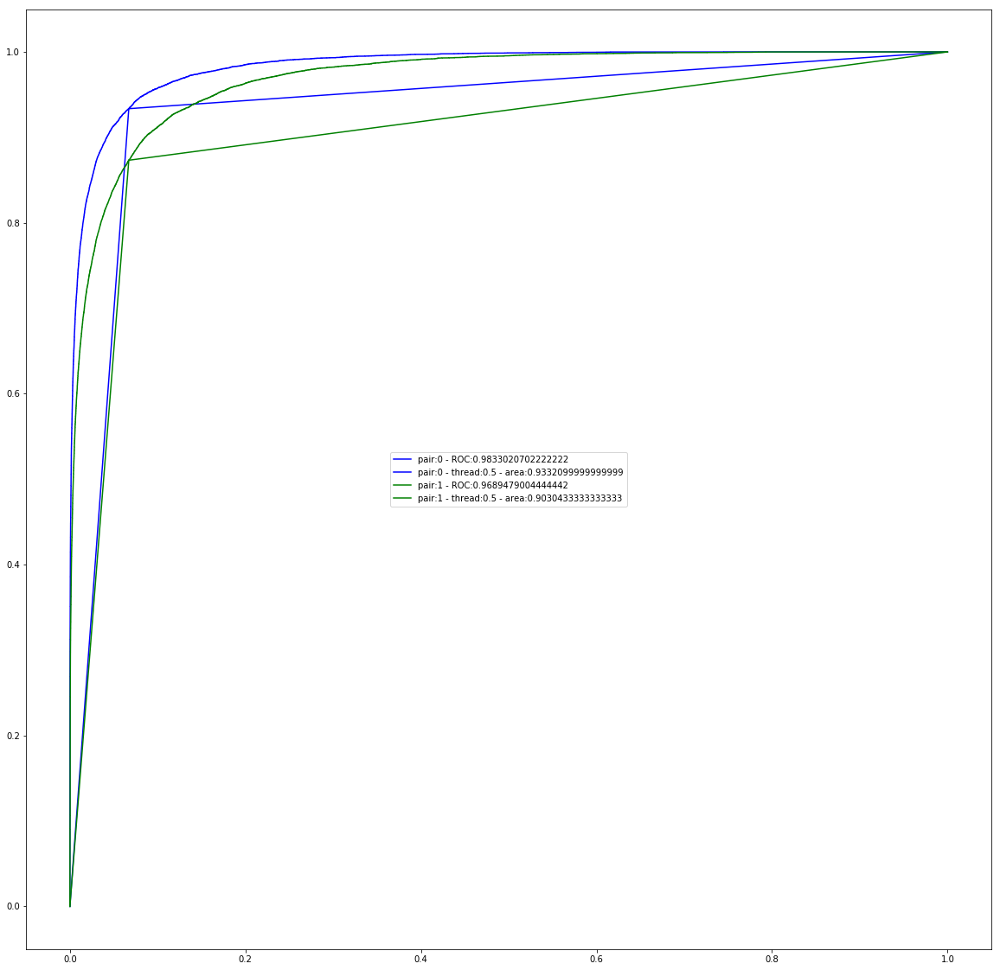

([(0.06711333333333333, 0.9335333333333333), (0.06711333333333333, 0.8732)],
 [0.9332099999999999, 0.9030433333333333])

In [529]:
evaluate_point(0.5,[(y_actual, y_pred), (y_actual, y_pred_shift)])

In [ ]:
p1 = [ 0.1, 0.5 , 0.6]
a1 = [0, 0, 1]